In [118]:
#!/usr/bin/python3

%load_ext autoreload
%autoreload 2

# Standard Libraries
import argparse
import os
import sys
from tqdm import tqdm

# Python Modules
from collections import Counter
from dataclasses import dataclass
from typing import NamedTuple
from collections import namedtuple
import gc

# Type Hint Libraries
from typing import Optional, Tuple, Union, TypeVar, List
import numpy.typing as npt
import matplotlib.figure
from torch import Tensor

# Math and Data Science Libraries
import numpy as np
import pandas as pd
from scipy.ndimage.filters import convolve

# Plot Libraries
import matplotlib.pyplot as plt
from matplotlib.backend_bases import MouseButton

# Machine Learning Libraries
from sklearn.cluster import KMeans
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
from torch.utils.data import DataLoader

# Image Libraries
import cv2 

import skimage as ski
from skimage import io
from skimage.color import rgb2gray
from skimage.color import rgb2hsv
from skimage.color import hsv2rgb
from skimage.filters import threshold_otsu
from skimage.morphology import area_opening
from skimage.morphology import area_closing
from skimage.morphology import (erosion, dilation, closing, opening)

# User defined methods and classes
from utils import parse_line
from utils import lines_to_polygons
from utils import build_mask_dataset
from utils import mask_in_set
from utils import nodes_to_points
from utils import plot_image_and_mask
from utils import create_binary_mask

from Unet_model import UNET

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


C:\Users\rzamb\AppData\Local\Temp\ipykernel_28484\3969620108.py:28: DeprecationWarning: Please use `convolve` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import convolve


Setting up the images location

In [39]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [2]:
os.getcwd()

'C:\\Users\\rzamb\\Documents\\UMD\\640_Computer_Vision\\HW\\microstructure_semantic_segmentation'

In [15]:
# Loading image names
# Path to dataset
DATA_PATH = "./aachen_heerlen_dataset/PNG/PNG/"
# Creating a path to save masks
MASKS_PATH = "./aachen_heerlen_dataset/masks/"

In [16]:
# Creates a list of the *.png file names in the dataset
image_files = os.listdir(DATA_PATH)

In [17]:
image_names = []

for file_name in image_files:
    image_names.append(file_name.replace('.png',''))

Setting up images location

In [6]:
# Path to models
models_path = []

for i in range(10):
    models_path.append('./model/unet_weigths_v{}.pth'.format(i+1))

models_path

['./model/unet_weigths_v1.pth',
 './model/unet_weigths_v2.pth',
 './model/unet_weigths_v3.pth',
 './model/unet_weigths_v4.pth',
 './model/unet_weigths_v5.pth',
 './model/unet_weigths_v6.pth',
 './model/unet_weigths_v7.pth',
 './model/unet_weigths_v8.pth',
 './model/unet_weigths_v9.pth',
 './model/unet_weigths_v10.pth']

In [40]:
runs_descriptions = ['epochs:   5 - samples:  100',
 'epochs:  20 - samples:  100',
 'epochs:  20 - samples:  500',
 'epochs:  20 - samples: 1000',
 'epochs:  20 - samples: 1300',
 'epochs:  50 - samples: 1300',
 'epochs: 250 - samples: 1300',
 'epochs:  10 - samples: 1500',
 'epochs:  15 - samples: 1700',
 'epochs:  25 - samples: 1700'
]

In [48]:
print('=============================================================================')
print('|                            Available Model Weiths                         |')
print('=============================================================================')
for i in range(len(models_path)):
    print('| Index:', i, ' - ', runs_descriptions[i], ' - ',models_path[i],' |')
print('=============================================================================')

|                            Available Model Weiths                         |
| Index: 0  -  epochs:   5 - samples:  100  -  ./model/unet_weigths_v1.pth  |
| Index: 1  -  epochs:  20 - samples:  100  -  ./model/unet_weigths_v2.pth  |
| Index: 2  -  epochs:  20 - samples:  500  -  ./model/unet_weigths_v3.pth  |
| Index: 3  -  epochs:  20 - samples: 1000  -  ./model/unet_weigths_v4.pth  |
| Index: 4  -  epochs:  20 - samples: 1300  -  ./model/unet_weigths_v5.pth  |
| Index: 5  -  epochs:  50 - samples: 1300  -  ./model/unet_weigths_v6.pth  |
| Index: 6  -  epochs: 250 - samples: 1300  -  ./model/unet_weigths_v7.pth  |
| Index: 7  -  epochs:  10 - samples: 1500  -  ./model/unet_weigths_v8.pth  |
| Index: 8  -  epochs:  15 - samples: 1700  -  ./model/unet_weigths_v9.pth  |
| Index: 9  -  epochs:  25 - samples: 1700  -  ./model/unet_weigths_v10.pth  |


In [78]:
# Creating an instance of UNET and loading the weights of a model
model = UNET().to(device)
checkpoint = torch.load(models_path[7])

In [79]:
print(model)

UNET(
  (encoder): Encoder(
    (enc_layers): ModuleList(
      (0): CNNBlocks(
        (layers): ModuleList(
          (0): CNNBlock(
            (seq_block): Sequential(
              (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): ReLU(inplace=True)
            )
          )
          (1): CNNBlock(
            (seq_block): Sequential(
              (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): ReLU(inplace=True)
            )
          )
        )
      )
      (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (2): CNNBlocks(
        (layers): ModuleList(
          (0): CNNBlock(
            (seq_block): Sequential(
              (0): Conv2d(64,

In [80]:
model.load_state_dict(checkpoint)

<All keys matched successfully>

In [81]:
model.eval()

UNET(
  (encoder): Encoder(
    (enc_layers): ModuleList(
      (0): CNNBlocks(
        (layers): ModuleList(
          (0): CNNBlock(
            (seq_block): Sequential(
              (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): ReLU(inplace=True)
            )
          )
          (1): CNNBlock(
            (seq_block): Sequential(
              (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (2): ReLU(inplace=True)
            )
          )
        )
      )
      (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (2): CNNBlocks(
        (layers): ModuleList(
          (0): CNNBlock(
            (seq_block): Sequential(
              (0): Conv2d(64,

In [82]:
full_path_img = DATA_PATH + image_names[0] + '.png'
full_path_msk = MASKS_PATH + image_names[0] + '.jpg'

In [83]:
curr_image = io.imread(full_path_img)
curr_mask = io.imread(full_path_msk)

In [84]:
curr_image =  rgb2gray(curr_image)
curr_mask = rgb2gray(curr_mask)

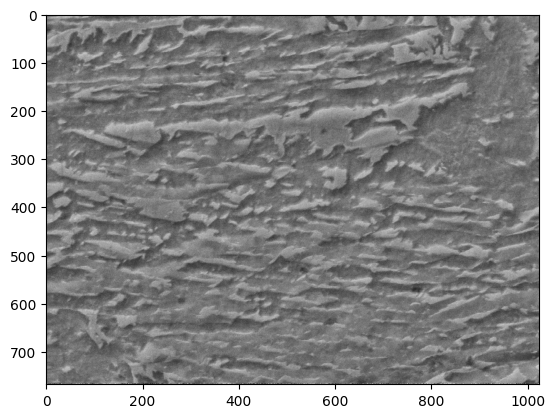

In [85]:
# Showing a test image and its mask
plt.imshow(curr_image, cmap=plt.cm.gray)
plt.show()

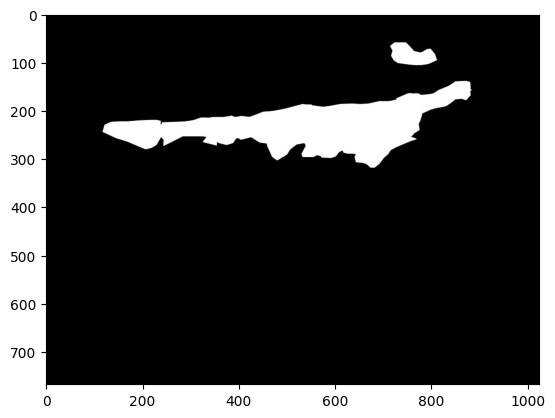

In [86]:
plt.imshow(curr_mask, cmap=plt.cm.gray)
plt.show()

In [87]:
curr_image_preprocessed = torch.tensor(curr_image).unsqueeze(dim=0).unsqueeze(dim=0).float()

In [88]:
curr_image_preprocessed.shape

torch.Size([1, 1, 768, 1024])

In [98]:
pred = model(curr_image_preprocessed.to(device))

In [99]:
mask_pred = torch.sigmoid(pred)
mask_pred = (mask_pred > 0.5).float()

In [100]:
mask_pred.shape

torch.Size([1, 1, 768, 1024])

In [101]:
mask_pred_postprocessed = Tensor.cpu(mask_pred.squeeze(dim=0).squeeze(dim=0)).detach().numpy()

In [102]:
mask_pred_postprocessed.shape

(768, 1024)

In [103]:
mask_pred_postprocessed

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

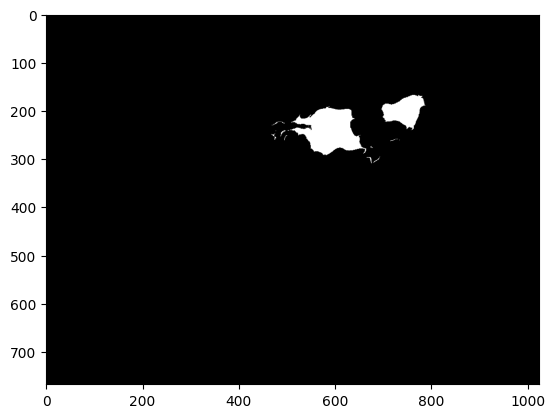

In [104]:
plt.imshow(mask_pred_postprocessed, cmap=plt.cm.gray)
plt.show()

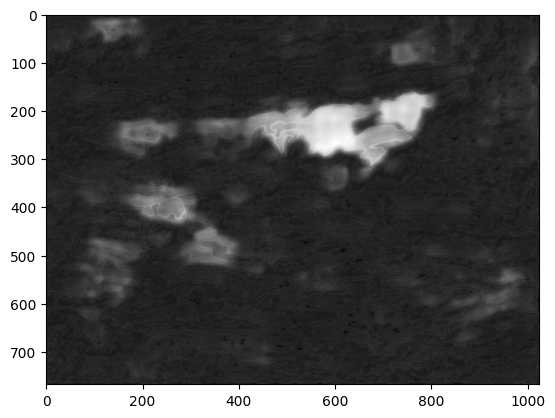

In [105]:
pred_img =Tensor.cpu(pred.squeeze(dim=0).squeeze(dim=0)).detach().numpy()
plt.imshow(pred_img, cmap=plt.cm.gray)
plt.show()

In [107]:
thresh = threshold_otsu(pred_img)
binary = pred_img > thresh

In [168]:
binary.shape

(768, 1024)

In [109]:
binary

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [110]:
binary.astype(int)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

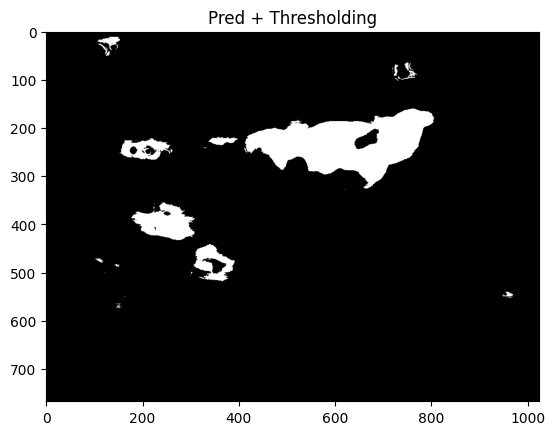

In [113]:
plt.imshow(binary.astype(int), cmap=plt.cm.gray)
plt.title('Pred + Thresholding')
plt.show()

In [123]:
element = np.array([[0,0,0,0,0,0,0],
                    [0,0,1,1,1,0,0],
                    [0,1,1,1,1,1,0],
                    [0,1,1,1,1,1,0],
                    [0,1,1,1,1,1,0],
                    [0,0,1,1,1,0,0],
                    [0,0,0,0,0,0,0]])

In [132]:
element = np.array([[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
                    [0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
                    [0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0],
                    [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]])

In [138]:
element2 = np.array(
    [[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
     [0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0],
     [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]])

In [139]:
element.shape

(16, 16)

In [140]:
element2.shape

(32, 32)

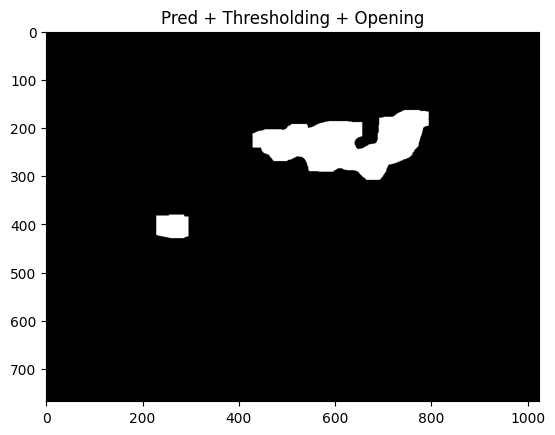

In [142]:
plt.imshow(opening(binary.astype(int),element2), cmap=plt.cm.gray)
plt.title('Pred + Thresholding + Opening')
plt.show()

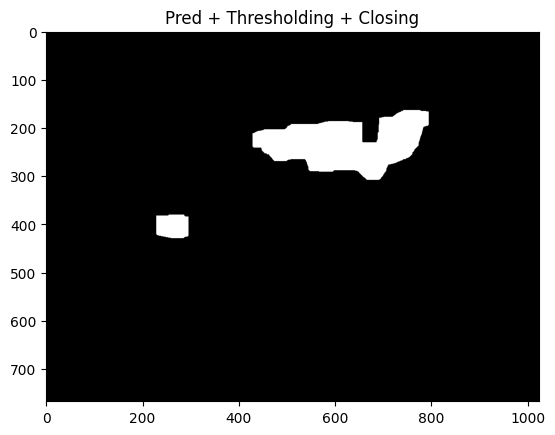

In [150]:
plt.imshow(closing(opening(binary.astype(int),element2),element2), cmap=plt.cm.gray)
plt.title('Pred + Thresholding + Closing')
plt.show()

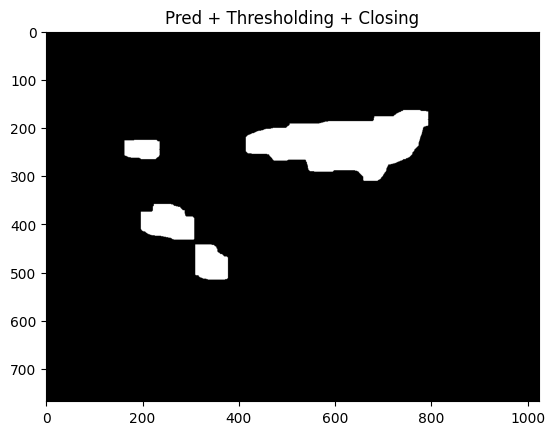

In [152]:
plt.imshow(opening(closing(binary.astype(int),element2),element2), cmap=plt.cm.gray)
plt.title('Pred + Thresholding + Closing')
plt.show()

Visualizing results

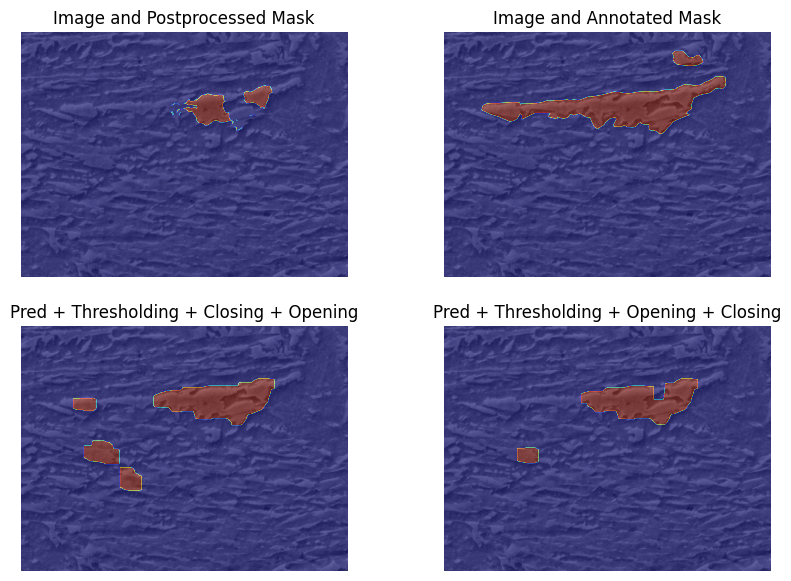

In [154]:
# Showing a test image and its mask
# create figure 
fig = plt.figure(figsize=(10, 7)) 
  
# setting values to rows and column variables 
rows = 2
columns = 2

fig.add_subplot(rows, columns, 1) 

plt.imshow(curr_image, cmap=plt.cm.gray)
plt.imshow(mask_pred_postprocessed, cmap='jet', alpha=0.5)
plt.axis('off') 
plt.title('Image and Postprocessed Mask')

fig.add_subplot(rows, columns, 2) 

plt.imshow(curr_image, cmap=plt.cm.gray)
plt.imshow(curr_mask, cmap='jet', alpha=0.5)
plt.axis('off') 
plt.title('Image and Annotated Mask')

fig.add_subplot(rows, columns, 3) 

plt.imshow(curr_image, cmap=plt.cm.gray)
plt.imshow(opening(closing(binary.astype(int),element2),element2), cmap='jet', alpha=0.5)
plt.axis('off') 
plt.title('Pred + Thresholding + Closing + Opening')

fig.add_subplot(rows, columns, 4) 

plt.imshow(curr_image, cmap=plt.cm.gray)
plt.imshow(closing(opening(binary.astype(int),element2),element2), cmap='jet', alpha=0.5)
plt.axis('off') 
plt.title('Pred + Thresholding + Opening + Closing')


plt.show()

In [167]:
def calculateIoU(gtMask, predMask):
    """
    Helper method to calculate intersection over union metric
    """
    assert gtMask.shape == predMask.shape, 'Masks must have the same shape'
    
    # Calculate the true positives,
    # false positives, and false negatives
    tp = 0
    fp = 0
    fn = 0

    for i in range(len(gtMask)):
        for j in range(len(gtMask[0])):
            if gtMask[i][j] == 1 and predMask[i][j] == 1:
                tp += 1
            elif gtMask[i][j] == 0 and predMask[i][j] == 1:
                fp += 1
            elif gtMask[i][j] == 1 and predMask[i][j] == 0:
                fn += 1

    # Calculate IoU
    iou = tp / (tp + fp + fn)

    return iou

In [161]:
a = np.zeros((768, 1024,3), dtype=np.uint8)
a.shape

(768, 1024, 3)

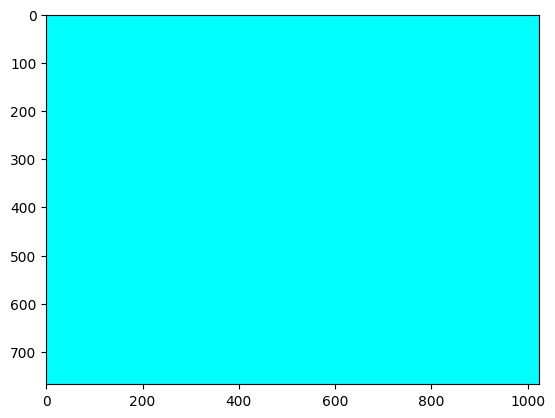

In [163]:
# Testing cyan color
a[:,:,1] = 255
a[:,:,2] = 255
plt.imshow(a)
plt.show()

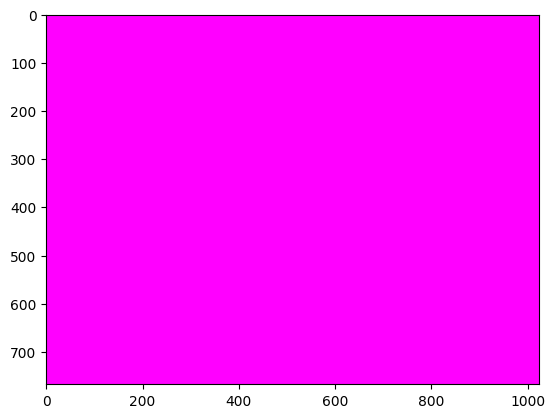

In [164]:
# Testing magenta color
a = np.zeros((768, 1024,3), dtype=np.uint8)
a[:,:,0] = 255
a[:,:,2] = 255
plt.imshow(a)
plt.show()

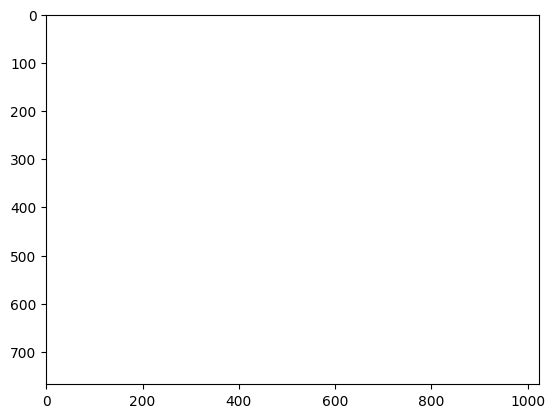

In [166]:
# Testing white color
a = np.zeros((768, 1024,3), dtype=np.uint8)
a[:,:,0] = 255
a[:,:,1] = 255
a[:,:,2] = 255
plt.imshow(a)
plt.show()

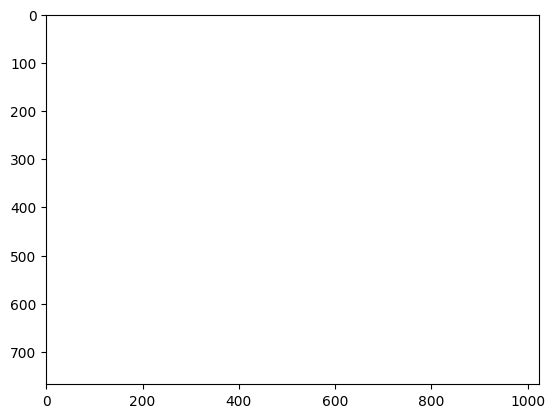

In [169]:
# Testing white color
a = np.zeros((768, 1024,3), dtype=np.uint8)
a[:,:,:] = 255
plt.imshow(a)
plt.show()

In [170]:
def graphIoU(gtMask, predMask):
    """
    Helper method to generate an image to visualize intersection over union metric
    """
    assert gtMask.shape == predMask.shape, 'Masks must have the same shape'
    
    # Capturing image size
    h, w = gtMask.shape
    
    # Generating empty image
    iou_img = np.zeros((h, w,3), dtype=np.uint8)

    for i in range(len(gtMask)):
        for j in range(len(gtMask[0])):
            if gtMask[i][j] == 1 and predMask[i][j] == 1:
                # True positive
                iou_img[i,j,:] = 255
            elif gtMask[i][j] == 0 and predMask[i][j] == 1:
                # False positive
                iou_img[i,j,1] = 255
                iou_img[i,j,2] = 255
            elif gtMask[i][j] == 1 and predMask[i][j] == 0:
                # False negative
                iou_img[i,j,0] = 255
                iou_img[i,j,2] = 255

    return iou_img

In [171]:
iou_test = calculateIoU(curr_mask,mask_pred_postprocessed)
iou_test

0.2504658598301328

In [172]:
iou_mask = graphIoU(curr_mask,mask_pred_postprocessed)

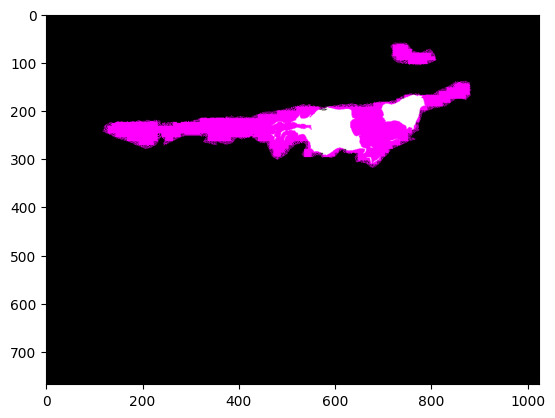

In [173]:
plt.imshow(iou_mask)
plt.show()

In [174]:
iou_test_2 = calculateIoU(curr_mask,opening(closing(binary.astype(int),element2),element2))
iou_test_2

0.5509578791201702

In [175]:
iou_mask_2 = graphIoU(curr_mask,opening(closing(binary.astype(int),element2),element2))

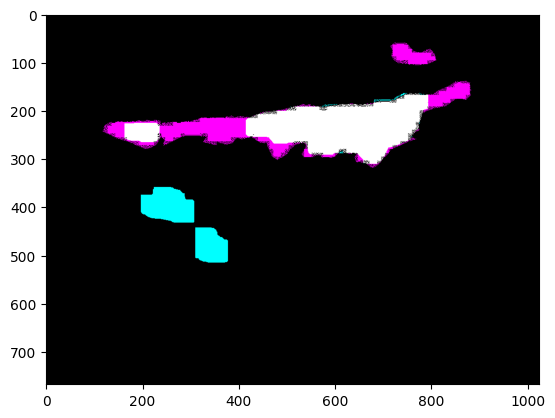

In [176]:
plt.imshow(iou_mask_2)
plt.show()

**The next step is comparing the generated models**

First I will chose 5% of the images randomly

In [201]:
len(image_names)

1705

In [202]:
selected_img_idx = np.random.choice(list(range(len(image_names))),size=90,replace=False)

In [203]:
len(selected_img_idx) == len(set(selected_img_idx))

True

In [204]:
test_images = []
test_masks = []

for idx in selected_img_idx:
    img_path = DATA_PATH + image_names[idx] + '.png'
    msk_path = MASKS_PATH + image_names[idx] + '.jpg'

    curr_image = io.imread(img_path)
    test_images.append(rgb2gray(curr_image))
    
    curr_mask = io.imread(msk_path)
    test_masks.append(rgb2gray(curr_mask).round())

In [205]:
len(test_images)

90

In [207]:
model_raw_mask_performance = []
model_pred_mask_performance = []

for model_weigths in tqdm(models_path):
    
    print('Working with model-> ', model_weigths)
    # Creating an instance of UNET and loading the weights of a model
    model = UNET().to(device)
    checkpoint = torch.load(model_weigths)
    model.load_state_dict(checkpoint)
    model.eval()
    
    mask_iou_list = []
    raw_mask_iou_list = [] 
    
    for i in range(len(test_images)):
        
        print('Image: ',i+1)
        
        curr_image = test_images[i]
        curr_mask = test_masks[i]
        
        # Preparing image for passing it through the network
        curr_image_preprocessed = torch.tensor(curr_image).unsqueeze(dim=0).unsqueeze(dim=0).float()

        # Image through model
        pred = model(curr_image_preprocessed.to(device))

        # Post processing predicted mask
        mask_pred = torch.sigmoid(pred)
        mask_pred = (mask_pred > 0.5).float()
        # Post processing predicted mask
        mask_pred_postprocessed = Tensor.cpu(mask_pred.squeeze(dim=0).squeeze(dim=0)).detach().numpy()

        # Post processing raw mask
        pred_img =Tensor.cpu(pred.squeeze(dim=0).squeeze(dim=0)).detach().numpy()
        # Applying thresholding to raw mask
        thresh = threshold_otsu(pred_img)
        binary = pred_img > thresh
        binary = binary.astype(int)
        # Opening and closing operations in raw mask
        pred_img_postprocess =  closing(opening(binary,element2),element2)

        # Calculating IoU
        mask_iou = calculateIoU(curr_mask,mask_pred_postprocessed)
        raw_mask_iou = calculateIoU(curr_mask,pred_img_postprocess)
        
        mask_iou_list.append(mask_iou)
        raw_mask_iou_list.append(raw_mask_iou ) 
        
    mean_mask_iou = sum(mask_iou_list)/len(mask_iou_list)
    mean_raw_mask_iou = sum(raw_mask_iou_list)/len(raw_mask_iou_list)
    
    model_pred_mask_performance.append(mean_mask_iou)
    model_raw_mask_performance.append(mean_raw_mask_iou)
    
    print('Model pred mask performance so fa: ',model_pred_mask_performance)
    print('Model raw mask performance so far: ',model_raw_mask_performance)

  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

Working with model->  ./model/unet_weigths_v1.pth
Image:  1
Image:  2
Image:  3
Image:  4
Image:  5
Image:  6
Image:  7
Image:  8
Image:  9
Image:  10
Image:  11
Image:  12
Image:  13
Image:  14
Image:  15
Image:  16
Image:  17
Image:  18
Image:  19
Image:  20
Image:  21
Image:  22
Image:  23
Image:  24
Image:  25
Image:  26
Image:  27
Image:  28
Image:  29
Image:  30
Image:  31
Image:  32
Image:  33
Image:  34
Image:  35
Image:  36
Image:  37
Image:  38
Image:  39
Image:  40
Image:  41
Image:  42
Image:  43
Image:  44
Image:  45
Image:  46
Image:  47
Image:  48
Image:  49
Image:  50
Image:  51
Image:  52
Image:  53
Image:  54
Image:  55
Image:  56
Image:  57
Image:  58
Image:  59
Image:  60
Image:  61
Image:  62
Image:  63
Image:  64
Image:  65
Image:  66
Image:  67
Image:  68
Image:  69
Image:  70
Image:  71
Image:  72
Image:  73
Image:  74
Image:  75
Image:  76
Image:  77
Image:  78
Image:  79
Image:  80
Image:  81
Image:  82
Image:  83
Image:  84
Image:  85
Image:  86
Image:  87
Im

 10%|████████                                                                        | 1/10 [14:19<2:08:51, 859.01s/it]

Model pred mask performance so fa:  [0.005409964929728025]
Model raw mask performance so far:  [0.0006117065365220545]
Working with model->  ./model/unet_weigths_v2.pth
Image:  1
Image:  2
Image:  3
Image:  4
Image:  5
Image:  6
Image:  7
Image:  8
Image:  9
Image:  10
Image:  11
Image:  12
Image:  13
Image:  14
Image:  15
Image:  16
Image:  17
Image:  18
Image:  19
Image:  20
Image:  21
Image:  22
Image:  23
Image:  24
Image:  25
Image:  26
Image:  27
Image:  28
Image:  29
Image:  30
Image:  31
Image:  32
Image:  33
Image:  34
Image:  35
Image:  36
Image:  37
Image:  38
Image:  39
Image:  40
Image:  41
Image:  42
Image:  43
Image:  44
Image:  45
Image:  46
Image:  47
Image:  48
Image:  49
Image:  50
Image:  51
Image:  52
Image:  53
Image:  54
Image:  55
Image:  56
Image:  57
Image:  58
Image:  59
Image:  60
Image:  61
Image:  62
Image:  63
Image:  64
Image:  65
Image:  66
Image:  67
Image:  68
Image:  69
Image:  70
Image:  71
Image:  72
Image:  73
Image:  74
Image:  75
Image:  76
Imag

 20%|████████████████                                                                | 2/10 [29:36<1:59:05, 893.20s/it]

Model pred mask performance so fa:  [0.005409964929728025, 0.03705814498548908]
Model raw mask performance so far:  [0.0006117065365220545, 0.016319685876735365]
Working with model->  ./model/unet_weigths_v3.pth
Image:  1
Image:  2
Image:  3
Image:  4
Image:  5
Image:  6
Image:  7
Image:  8
Image:  9
Image:  10
Image:  11
Image:  12
Image:  13
Image:  14
Image:  15
Image:  16
Image:  17
Image:  18
Image:  19
Image:  20
Image:  21
Image:  22
Image:  23
Image:  24
Image:  25
Image:  26
Image:  27
Image:  28
Image:  29
Image:  30
Image:  31
Image:  32
Image:  33
Image:  34
Image:  35
Image:  36
Image:  37
Image:  38
Image:  39
Image:  40
Image:  41
Image:  42
Image:  43
Image:  44
Image:  45
Image:  46
Image:  47
Image:  48
Image:  49
Image:  50
Image:  51
Image:  52
Image:  53
Image:  54
Image:  55
Image:  56
Image:  57
Image:  58
Image:  59
Image:  60
Image:  61
Image:  62
Image:  63
Image:  64
Image:  65
Image:  66
Image:  67
Image:  68
Image:  69
Image:  70
Image:  71
Image:  72
Image

 30%|████████████████████████                                                        | 3/10 [44:38<1:44:41, 897.38s/it]

Model pred mask performance so fa:  [0.005409964929728025, 0.03705814498548908, 0.18215293318731665]
Model raw mask performance so far:  [0.0006117065365220545, 0.016319685876735365, 0.21860438569908483]
Working with model->  ./model/unet_weigths_v4.pth
Image:  1
Image:  2
Image:  3
Image:  4
Image:  5
Image:  6
Image:  7
Image:  8
Image:  9
Image:  10
Image:  11
Image:  12
Image:  13
Image:  14
Image:  15
Image:  16
Image:  17
Image:  18
Image:  19
Image:  20
Image:  21
Image:  22
Image:  23
Image:  24
Image:  25
Image:  26
Image:  27
Image:  28
Image:  29
Image:  30
Image:  31
Image:  32
Image:  33
Image:  34
Image:  35
Image:  36
Image:  37
Image:  38
Image:  39
Image:  40
Image:  41
Image:  42
Image:  43
Image:  44
Image:  45
Image:  46
Image:  47
Image:  48
Image:  49
Image:  50
Image:  51
Image:  52
Image:  53
Image:  54
Image:  55
Image:  56
Image:  57
Image:  58
Image:  59
Image:  60
Image:  61
Image:  62
Image:  63
Image:  64
Image:  65
Image:  66
Image:  67
Image:  68
Image: 

 40%|███████████████████████████████▏                                              | 4/10 [1:00:11<1:31:09, 911.56s/it]

Model pred mask performance so fa:  [0.005409964929728025, 0.03705814498548908, 0.18215293318731665, 0.22107444590269823]
Model raw mask performance so far:  [0.0006117065365220545, 0.016319685876735365, 0.21860438569908483, 0.3280799075904663]
Working with model->  ./model/unet_weigths_v5.pth
Image:  1
Image:  2
Image:  3
Image:  4
Image:  5
Image:  6
Image:  7
Image:  8
Image:  9
Image:  10
Image:  11
Image:  12
Image:  13
Image:  14
Image:  15
Image:  16
Image:  17
Image:  18
Image:  19
Image:  20
Image:  21
Image:  22
Image:  23
Image:  24
Image:  25
Image:  26
Image:  27
Image:  28
Image:  29
Image:  30
Image:  31
Image:  32
Image:  33
Image:  34
Image:  35
Image:  36
Image:  37
Image:  38
Image:  39
Image:  40
Image:  41
Image:  42
Image:  43
Image:  44
Image:  45
Image:  46
Image:  47
Image:  48
Image:  49
Image:  50
Image:  51
Image:  52
Image:  53
Image:  54
Image:  55
Image:  56
Image:  57
Image:  58
Image:  59
Image:  60
Image:  61
Image:  62
Image:  63
Image:  64
Image:  65

 50%|███████████████████████████████████████                                       | 5/10 [1:15:25<1:16:01, 912.25s/it]

Model pred mask performance so fa:  [0.005409964929728025, 0.03705814498548908, 0.18215293318731665, 0.22107444590269823, 0.26438509815828015]
Model raw mask performance so far:  [0.0006117065365220545, 0.016319685876735365, 0.21860438569908483, 0.3280799075904663, 0.3091470629150385]
Working with model->  ./model/unet_weigths_v6.pth
Image:  1
Image:  2
Image:  3
Image:  4
Image:  5
Image:  6
Image:  7
Image:  8
Image:  9
Image:  10
Image:  11
Image:  12
Image:  13
Image:  14
Image:  15
Image:  16
Image:  17
Image:  18
Image:  19
Image:  20
Image:  21
Image:  22
Image:  23
Image:  24
Image:  25
Image:  26
Image:  27
Image:  28
Image:  29
Image:  30
Image:  31
Image:  32
Image:  33
Image:  34
Image:  35
Image:  36
Image:  37
Image:  38
Image:  39
Image:  40
Image:  41
Image:  42
Image:  43
Image:  44
Image:  45
Image:  46
Image:  47
Image:  48
Image:  49
Image:  50
Image:  51
Image:  52
Image:  53
Image:  54
Image:  55
Image:  56
Image:  57
Image:  58
Image:  59
Image:  60
Image:  61
Im

 60%|██████████████████████████████████████████████▊                               | 6/10 [1:30:31<1:00:40, 910.07s/it]

Model pred mask performance so fa:  [0.005409964929728025, 0.03705814498548908, 0.18215293318731665, 0.22107444590269823, 0.26438509815828015, 0.594637296549148]
Model raw mask performance so far:  [0.0006117065365220545, 0.016319685876735365, 0.21860438569908483, 0.3280799075904663, 0.3091470629150385, 0.5457232030949861]
Working with model->  ./model/unet_weigths_v7.pth
Image:  1
Image:  2
Image:  3
Image:  4
Image:  5
Image:  6
Image:  7
Image:  8
Image:  9
Image:  10
Image:  11
Image:  12
Image:  13
Image:  14
Image:  15
Image:  16
Image:  17
Image:  18
Image:  19
Image:  20
Image:  21
Image:  22
Image:  23
Image:  24
Image:  25
Image:  26
Image:  27
Image:  28
Image:  29
Image:  30
Image:  31
Image:  32
Image:  33
Image:  34
Image:  35
Image:  36
Image:  37
Image:  38
Image:  39
Image:  40
Image:  41
Image:  42
Image:  43
Image:  44
Image:  45
Image:  46
Image:  47
Image:  48
Image:  49
Image:  50
Image:  51
Image:  52
Image:  53
Image:  54
Image:  55
Image:  56
Image:  57
Image: 

 70%|████████████████████████████████████████████████████████                        | 7/10 [1:45:39<45:28, 909.66s/it]

Model pred mask performance so fa:  [0.005409964929728025, 0.03705814498548908, 0.18215293318731665, 0.22107444590269823, 0.26438509815828015, 0.594637296549148, 0.7143916338848979]
Model raw mask performance so far:  [0.0006117065365220545, 0.016319685876735365, 0.21860438569908483, 0.3280799075904663, 0.3091470629150385, 0.5457232030949861, 0.5329916661902478]
Working with model->  ./model/unet_weigths_v8.pth
Image:  1
Image:  2
Image:  3
Image:  4
Image:  5
Image:  6
Image:  7
Image:  8
Image:  9
Image:  10
Image:  11
Image:  12
Image:  13
Image:  14
Image:  15
Image:  16
Image:  17
Image:  18
Image:  19
Image:  20
Image:  21
Image:  22
Image:  23
Image:  24
Image:  25
Image:  26
Image:  27
Image:  28
Image:  29
Image:  30
Image:  31
Image:  32
Image:  33
Image:  34
Image:  35
Image:  36
Image:  37
Image:  38
Image:  39
Image:  40
Image:  41
Image:  42
Image:  43
Image:  44
Image:  45
Image:  46
Image:  47
Image:  48
Image:  49
Image:  50
Image:  51
Image:  52
Image:  53
Image:  54


 80%|████████████████████████████████████████████████████████████████                | 8/10 [2:00:16<29:58, 899.26s/it]

Model pred mask performance so fa:  [0.005409964929728025, 0.03705814498548908, 0.18215293318731665, 0.22107444590269823, 0.26438509815828015, 0.594637296549148, 0.7143916338848979, 0.27736919646302244]
Model raw mask performance so far:  [0.0006117065365220545, 0.016319685876735365, 0.21860438569908483, 0.3280799075904663, 0.3091470629150385, 0.5457232030949861, 0.5329916661902478, 0.319541483078247]
Working with model->  ./model/unet_weigths_v9.pth
Image:  1
Image:  2
Image:  3
Image:  4
Image:  5
Image:  6
Image:  7
Image:  8
Image:  9
Image:  10
Image:  11
Image:  12
Image:  13
Image:  14
Image:  15
Image:  16
Image:  17
Image:  18
Image:  19
Image:  20
Image:  21
Image:  22
Image:  23
Image:  24
Image:  25
Image:  26
Image:  27
Image:  28
Image:  29
Image:  30
Image:  31
Image:  32
Image:  33
Image:  34
Image:  35
Image:  36
Image:  37
Image:  38
Image:  39
Image:  40
Image:  41
Image:  42
Image:  43
Image:  44
Image:  45
Image:  46
Image:  47
Image:  48
Image:  49
Image:  50
Imag

 90%|████████████████████████████████████████████████████████████████████████        | 9/10 [2:14:43<14:48, 888.95s/it]

Model pred mask performance so fa:  [0.005409964929728025, 0.03705814498548908, 0.18215293318731665, 0.22107444590269823, 0.26438509815828015, 0.594637296549148, 0.7143916338848979, 0.27736919646302244, 0.3391370335775756]
Model raw mask performance so far:  [0.0006117065365220545, 0.016319685876735365, 0.21860438569908483, 0.3280799075904663, 0.3091470629150385, 0.5457232030949861, 0.5329916661902478, 0.319541483078247, 0.34107567016881485]
Working with model->  ./model/unet_weigths_v10.pth
Image:  1
Image:  2
Image:  3
Image:  4
Image:  5
Image:  6
Image:  7
Image:  8
Image:  9
Image:  10
Image:  11
Image:  12
Image:  13
Image:  14
Image:  15
Image:  16
Image:  17
Image:  18
Image:  19
Image:  20
Image:  21
Image:  22
Image:  23
Image:  24
Image:  25
Image:  26
Image:  27
Image:  28
Image:  29
Image:  30
Image:  31
Image:  32
Image:  33
Image:  34
Image:  35
Image:  36
Image:  37
Image:  38
Image:  39
Image:  40
Image:  41
Image:  42
Image:  43
Image:  44
Image:  45
Image:  46
Image:

100%|███████████████████████████████████████████████████████████████████████████████| 10/10 [2:29:19<00:00, 895.92s/it]

Model pred mask performance so fa:  [0.005409964929728025, 0.03705814498548908, 0.18215293318731665, 0.22107444590269823, 0.26438509815828015, 0.594637296549148, 0.7143916338848979, 0.27736919646302244, 0.3391370335775756, 0.5235538224761707]
Model raw mask performance so far:  [0.0006117065365220545, 0.016319685876735365, 0.21860438569908483, 0.3280799075904663, 0.3091470629150385, 0.5457232030949861, 0.5329916661902478, 0.319541483078247, 0.34107567016881485, 0.5297133213686697]


In [208]:
models_path[6]

'./model/unet_weigths_v7.pth'

In [209]:
runs_descriptions[6]

'epochs: 250 - samples: 1300'

In [210]:
runs_descriptions

['epochs:   5 - samples:  100',
 'epochs:  20 - samples:  100',
 'epochs:  20 - samples:  500',
 'epochs:  20 - samples: 1000',
 'epochs:  20 - samples: 1300',
 'epochs:  50 - samples: 1300',
 'epochs: 250 - samples: 1300',
 'epochs:  10 - samples: 1500',
 'epochs:  15 - samples: 1700',
 'epochs:  25 - samples: 1700']

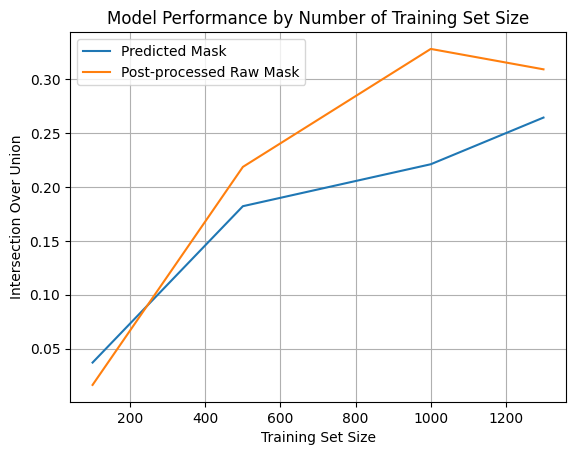

In [213]:
xx_sample_size = [100,500,1000,1300]
yy_iou_pred = [0.03705814498548908, 0.18215293318731665, 0.22107444590269823, 0.26438509815828015]
yy_iou_raw_pred = [0.016319685876735365, 0.21860438569908483, 0.3280799075904663, 0.3091470629150385]

plt.plot(xx_sample_size, yy_iou_pred, label = 'Predicted Mask')

plt.plot(xx_sample_size, yy_iou_raw_pred, label = 'Post-processed Raw Mask')

plt.xlabel("Training Set Size")
plt.ylabel("Intersection Over Union")
plt.title('Model Performance by Number of Training Set Size')
plt.grid()
plt.legend()

plt.show()

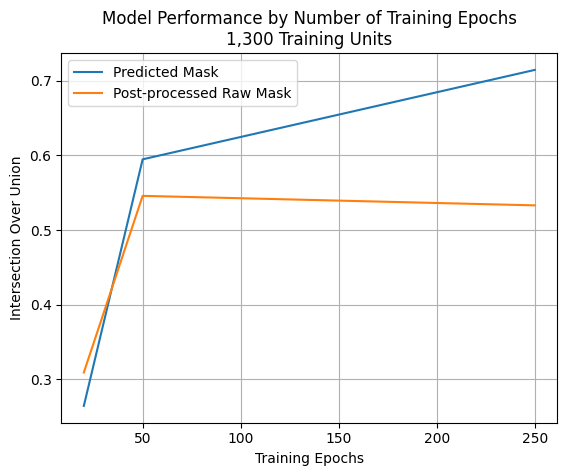

In [216]:
xx_sample_size = [20,50,250]
yy_iou_pred = [0.3391370335775756, 0.5235538224761707]
yy_iou_raw_pred = [0.3091470629150385, 0.5457232030949861, 0.5329916661902478]

plt.plot(xx_sample_size, yy_iou_pred, label = 'Predicted Mask')

plt.plot(xx_sample_size, yy_iou_raw_pred, label = 'Post-processed Raw Mask')

plt.xlabel("Training Epochs")
plt.ylabel("Intersection Over Union")
plt.title('Model Performance by Number of Training Epochs\n1,300 Training Units')

plt.grid()
plt.legend()

plt.show()

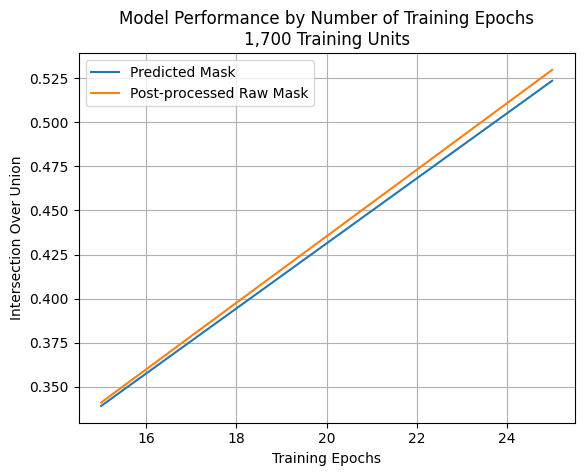

In [218]:
xx_sample_size = [15,25]
yy_iou_pred = [0.3391370335775756, 0.5235538224761707]
yy_iou_raw_pred = [0.34107567016881485, 0.5297133213686697]

plt.plot(xx_sample_size, yy_iou_pred, label = 'Predicted Mask')

plt.plot(xx_sample_size, yy_iou_raw_pred, label = 'Post-processed Raw Mask')

plt.xlabel("Training Epochs")
plt.ylabel("Intersection Over Union")
plt.title('Model Performance by Number of Training Epochs\n1,700 Training Units')

plt.grid()
plt.legend()

plt.show()

Now I am going to predict masks with the best performing model

In [271]:
# Creating a path to save mask predictions
PREDS_PATH = "./aachen_heerlen_dataset/preds_unet_v7/"
# Creating a path to save mask comparisons
IOU_PATH = "./aachen_heerlen_dataset/IoU_unet_v7/"

In [221]:
models_path[6]

'./model/unet_weigths_v7.pth'

In [220]:
len(image_names)

1705

In [224]:
selected_img_idx = np.random.choice(list(range(len(image_names))),size=853,replace=False)

test_images = []
test_masks = []
image_sequence = []

for idx in selected_img_idx:
    img_path = DATA_PATH + image_names[idx] + '.png'
    msk_path = MASKS_PATH + image_names[idx] + '.jpg'

    image_sequence.append(image_names[idx])
    
    curr_image = io.imread(img_path)
    test_images.append(rgb2gray(curr_image))
    
    curr_mask = io.imread(msk_path)
    test_masks.append(rgb2gray(curr_mask).round())

In [225]:
image_sequence[0]

'IMG_01871'

In [230]:
print('Working with model-> ', models_path[6])
# Creating an instance of UNET and loading the weights of a model
model = UNET().to(device)
checkpoint = torch.load(models_path[6])
model.load_state_dict(checkpoint)
model.eval()

mask_iou_list = []
pred_masks = []

for i in range(len(test_images)):

    data_length = len(test_images)
    print('Image: ',i+1,'/',data_length)

    curr_image = test_images[i]
    curr_mask = test_masks[i]

    # Preparing image for passing it through the network
    curr_image_preprocessed = torch.tensor(curr_image).unsqueeze(dim=0).unsqueeze(dim=0).float()

    # Image through model
    pred = model(curr_image_preprocessed.to(device))

    # Post processing predicted mask
    mask_pred = torch.sigmoid(pred)
    mask_pred = (mask_pred > 0.5).float()
    # Post processing predicted mask
    mask_pred_postprocessed = Tensor.cpu(mask_pred.squeeze(dim=0).squeeze(dim=0)).detach().numpy()

    pred_masks.append(mask_pred_postprocessed)
    
    # Calculating IoU
    mask_iou = calculateIoU(curr_mask,mask_pred_postprocessed)

    mask_iou_list.append(mask_iou)

mean_mask_iou = sum(mask_iou_list)/len(mask_iou_list)

Working with model->  ./model/unet_weigths_v7.pth
Image:  1 / 853
Image:  2 / 853
Image:  3 / 853
Image:  4 / 853
Image:  5 / 853
Image:  6 / 853
Image:  7 / 853
Image:  8 / 853
Image:  9 / 853
Image:  10 / 853
Image:  11 / 853
Image:  12 / 853
Image:  13 / 853
Image:  14 / 853
Image:  15 / 853
Image:  16 / 853
Image:  17 / 853
Image:  18 / 853
Image:  19 / 853
Image:  20 / 853
Image:  21 / 853
Image:  22 / 853
Image:  23 / 853
Image:  24 / 853
Image:  25 / 853
Image:  26 / 853
Image:  27 / 853
Image:  28 / 853
Image:  29 / 853
Image:  30 / 853
Image:  31 / 853
Image:  32 / 853
Image:  33 / 853
Image:  34 / 853
Image:  35 / 853
Image:  36 / 853
Image:  37 / 853
Image:  38 / 853
Image:  39 / 853
Image:  40 / 853
Image:  41 / 853
Image:  42 / 853
Image:  43 / 853
Image:  44 / 853
Image:  45 / 853
Image:  46 / 853
Image:  47 / 853
Image:  48 / 853
Image:  49 / 853
Image:  50 / 853
Image:  51 / 853
Image:  52 / 853
Image:  53 / 853
Image:  54 / 853
Image:  55 / 853
Image:  56 / 853
Image: 

Image:  460 / 853
Image:  461 / 853
Image:  462 / 853
Image:  463 / 853
Image:  464 / 853
Image:  465 / 853
Image:  466 / 853
Image:  467 / 853
Image:  468 / 853
Image:  469 / 853
Image:  470 / 853
Image:  471 / 853
Image:  472 / 853
Image:  473 / 853
Image:  474 / 853
Image:  475 / 853
Image:  476 / 853
Image:  477 / 853
Image:  478 / 853
Image:  479 / 853
Image:  480 / 853
Image:  481 / 853
Image:  482 / 853
Image:  483 / 853
Image:  484 / 853
Image:  485 / 853
Image:  486 / 853
Image:  487 / 853
Image:  488 / 853
Image:  489 / 853
Image:  490 / 853
Image:  491 / 853
Image:  492 / 853
Image:  493 / 853
Image:  494 / 853
Image:  495 / 853
Image:  496 / 853
Image:  497 / 853
Image:  498 / 853
Image:  499 / 853
Image:  500 / 853
Image:  501 / 853
Image:  502 / 853
Image:  503 / 853
Image:  504 / 853
Image:  505 / 853
Image:  506 / 853
Image:  507 / 853
Image:  508 / 853
Image:  509 / 853
Image:  510 / 853
Image:  511 / 853
Image:  512 / 853
Image:  513 / 853
Image:  514 / 853
Image:  51

In [231]:
mean_mask_iou 

0.7417603201926359

In [232]:
mask_iou_list[0]

0.9757492893894146

In [233]:
image_sequence[0]

'IMG_01871'

In [236]:
dict = {'name':image_sequence,'IoU Metric':mask_iou_list}
df = pd.DataFrame(dict)

In [237]:
df.head()

,name,IoU Metric
0,IMG_01871,0.975749
1,IMG_00361,0.988471
2,IMG_02429,0.984047
3,IMG_00139,0.981054
4,IMG_01144,0.987227


In [238]:
# Saving the results
df.to_csv('predIoU_epochs_250_samples_1300.csv')

In [247]:
index = list(range(len(image_sequence)))

In [248]:
image_names_iou_performance = tuple(zip(index,image_sequence, mask_iou_list))

In [249]:
rank_imgs_iou = sorted(image_names_iou_performance, key=lambda x: x[2])

In [250]:
len(rank_imgs_iou)

853

In [254]:
rank_imgs_iou[:100]

[(27, 'IMG_00880', 0.0),
 (72, 'IMG_01451', 0.0),
 (81, 'IMG_00978', 0.0),
 (146, 'IMG_01338', 0.0),
 (168, 'IMG_01021', 0.0),
 (202, 'IMG_00669', 0.0),
 (242, 'IMG_01079', 0.0),
 (284, 'IMG_00996', 0.0),
 (318, 'IMG_01044', 0.0),
 (335, 'IMG_01035', 0.0),
 (340, 'IMG_01082', 0.0),
 (418, 'IMG_01217', 0.0),
 (498, 'IMG_01095', 0.0),
 (638, 'IMG_02178', 0.0),
 (644, 'IMG_01165', 0.0),
 (754, 'IMG_02006', 0.0),
 (821, 'IMG_01584', 0.0),
 (363, 'IMG_00705', 0.000731368390258173),
 (85, 'IMG_01291', 0.0025613660618996796),
 (485, 'IMG_02384', 0.004786385392660876),
 (331, 'IMG_01391', 0.004913395205717405),
 (319, 'IMG_00709', 0.0057296066404671836),
 (191, 'IMG_01221', 0.0061244649324991764),
 (64, 'IMG_00956', 0.0071149950613563695),
 (677, 'IMG_01025', 0.009074718005258248),
 (158, 'IMG_00178', 0.010981697171381031),
 (266, 'IMG_01276', 0.0172543135783946),
 (278, 'IMG_01094', 0.017480741555912976),
 (815, 'IMG_01002', 0.02832022211938917),
 (169, 'IMG_00959', 0.03423137876386688),
 (61

In [252]:
rank_imgs_iou[-10:]

[(643, 'IMG_00493', 0.9927991189510246),
 (336, 'IMG_00433', 0.9928080015164524),
 (123, 'IMG_02067', 0.9932824473299854),
 (645, 'IMG_00487', 0.9933036192598624),
 (581, 'IMG_00559', 0.9934466805217591),
 (503, 'IMG_01888', 0.9934800636017133),
 (832, 'IMG_00549', 0.9941332719066507),
 (228, 'IMG_00558', 0.9941862234803519),
 (230, 'IMG_00478', 0.9942374851817778),
 (77, 'IMG_00470', 0.9947901369565905)]

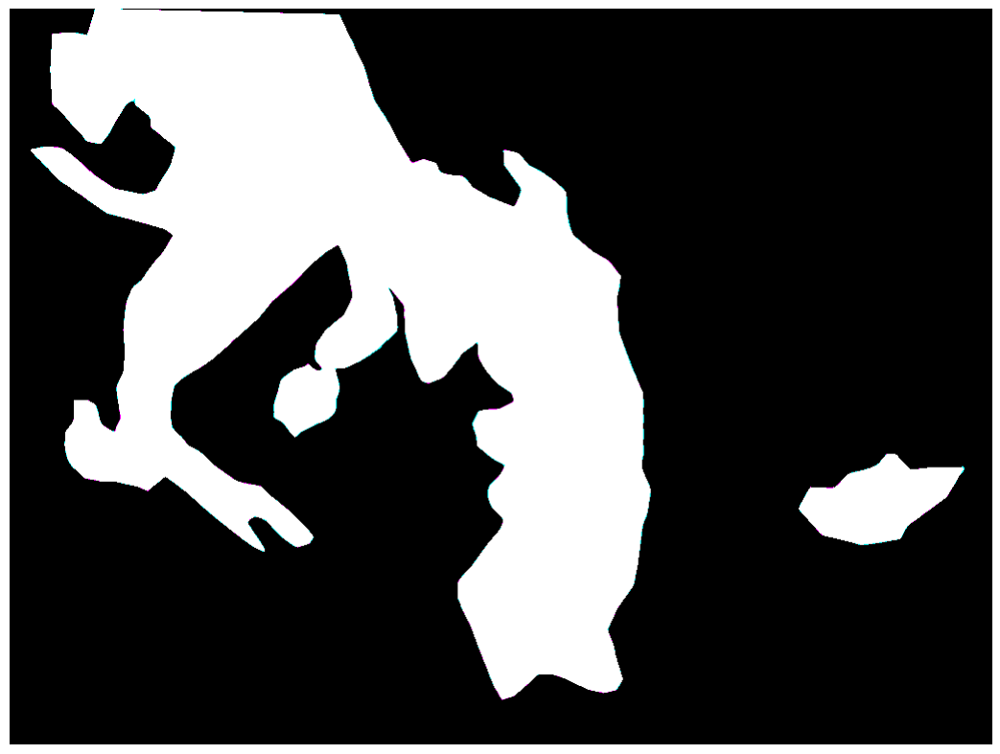

In [261]:
iou_img = graphIoU(test_masks[77], pred_masks[77])

# Creating the mask figure
my_dpi = 96
fig, ax = plt.subplots(figsize=(1322/my_dpi, 998/my_dpi), dpi=my_dpi)

plt.imshow(iou_img)
plt.axis('off')
plt.show()

fig.savefig('iou_img_test.jpg', dpi=96, bbox_inches='tight', pad_inches=0)

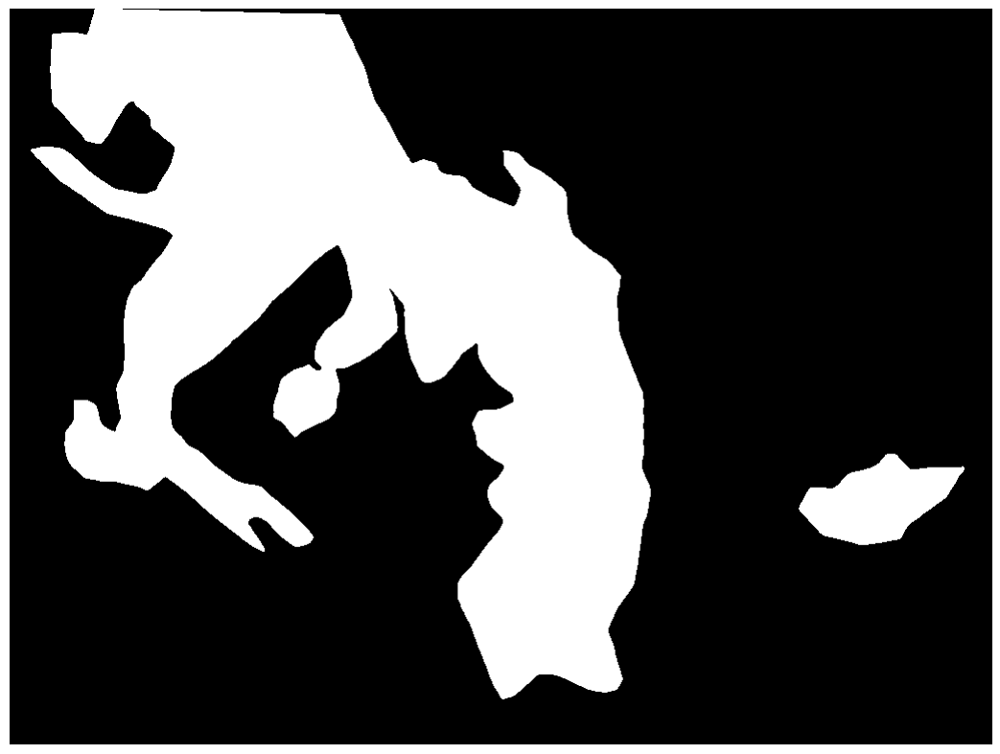

In [265]:
# Creating the mask figure
my_dpi = 96
fig, ax = plt.subplots(figsize=(1322/my_dpi, 998/my_dpi), dpi=my_dpi)

plt.imshow(pred_masks[77], cmap=plt.cm.gray)

plt.axis('off')
plt.show()

fig.savefig('pred_mask_test.jpg', dpi=96, bbox_inches='tight', pad_inches=0)

In [ ]:
fig.savefig('iou_img_test.jpg', dpi=96, bbox_inches='tight', pad_inches=0)

In [267]:
len(test_masks) == len(pred_masks)

True

In [268]:
iou_images = []

for i in range(len(test_masks)):
    
    iou_img = graphIoU(test_masks[i], pred_masks[i])
    iou_images.append(iou_img)

In [272]:
for i in tqdm(range(len(iou_images))):
    
    full_path = IOU_PATH + image_sequence[i] + '.jpg'
    
    # Creating the mask figure
    my_dpi = 96
    fig, ax = plt.subplots(figsize=(1322/my_dpi, 998/my_dpi), dpi=my_dpi)

    plt.imshow(iou_images[i])
    plt.axis('off')
    plt.close()

    fig.savefig(full_path, dpi=96, bbox_inches='tight', pad_inches=0)

100%|████████████████████████████████████████████████████████████████████████████████| 853/853 [02:16<00:00,  6.26it/s]


In [273]:
for i in tqdm(range(len(pred_masks))):
    
    full_path = PREDS_PATH + image_sequence[i] + '.jpg'
    
    # Creating the mask figure
    my_dpi = 96
    fig, ax = plt.subplots(figsize=(1322/my_dpi, 998/my_dpi), dpi=my_dpi)

    plt.imshow(pred_masks[i])
    plt.axis('off')
    plt.close()

    fig.savefig(full_path, dpi=96, bbox_inches='tight', pad_inches=0)

100%|████████████████████████████████████████████████████████████████████████████████| 853/853 [02:08<00:00,  6.64it/s]


In [280]:
# fixed bin size
bins = np.arange(0, 1.05, 0.05) # fixed bin size

In [281]:
performance_on_images = np.array(mask_iou_list)

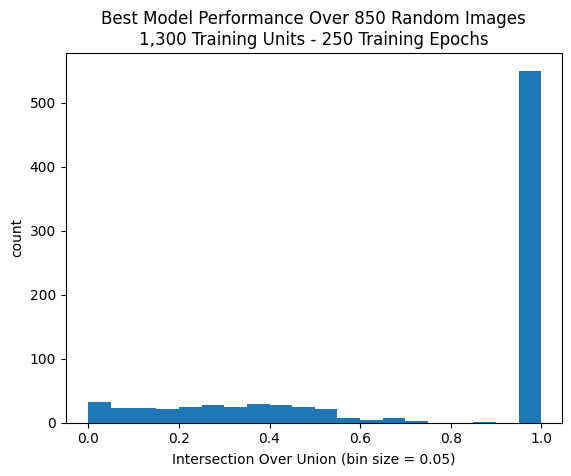

In [282]:
plt.xlim([min(performance_on_images)-0.05, max(performance_on_images)+0.05])

plt.hist(performance_on_images, bins=bins)
plt.title('Best Model Performance Over 850 Random Images\n1,300 Training Units - 250 Training Epochs')
plt.xlabel('Intersection Over Union (bin size = 0.05)')
plt.ylabel('count')

plt.show()

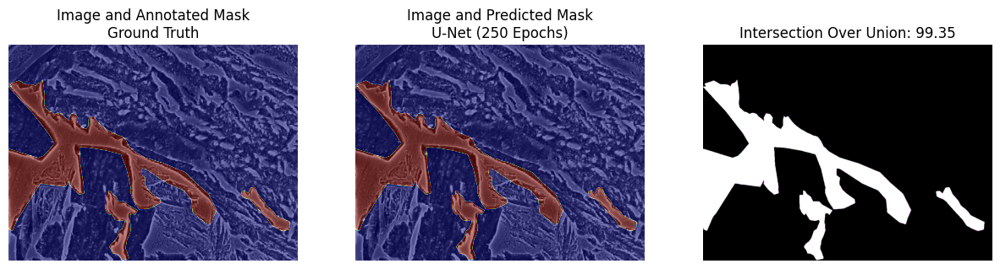

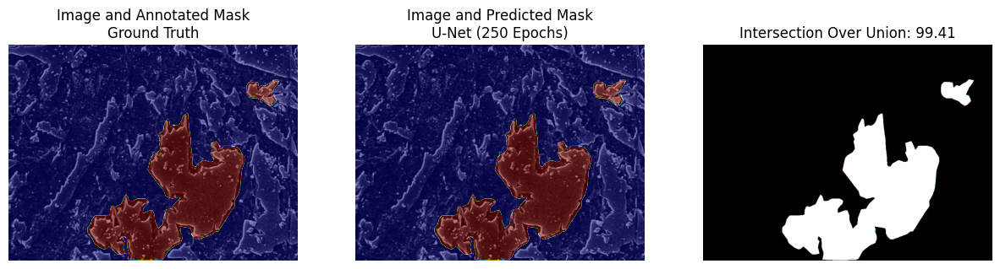

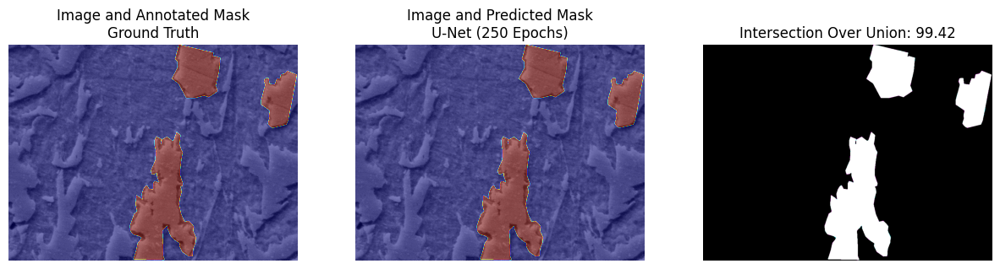

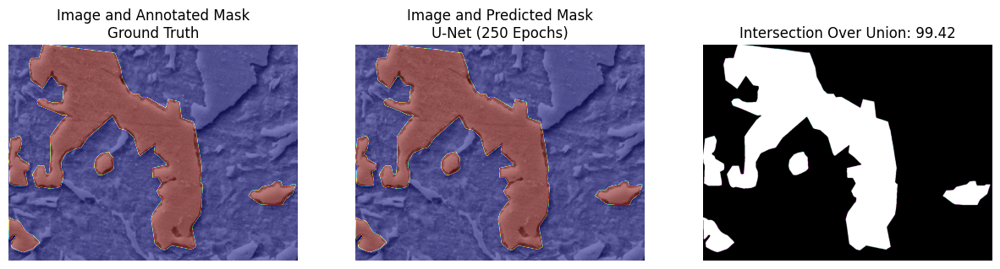

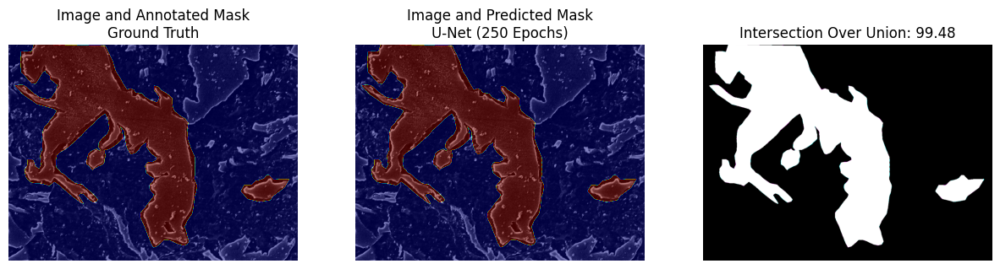

In [302]:
for item in rank_imgs_iou[-5:]:
    
    # create figure 
    fig = plt.figure(figsize=(15, 10)) 

    # setting values to rows and column variables 
    rows = 1
    columns = 3

    fig.add_subplot(rows, columns, 1) 

    #plt.suptitle(image_sequence[item[0]])
    
    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(test_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Annotated Mask\nGround Truth')

    fig.add_subplot(rows, columns, 2) 

    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(pred_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Predicted Mask\nU-Net (250 Epochs)')

    fig.add_subplot(rows, columns, 3) 

    plt.imshow(iou_images[item[0]])
    plt.axis('off') 
    plt.title('Intersection Over Union: {0:.2f}'.format(item[2]*100))

    plt.show()

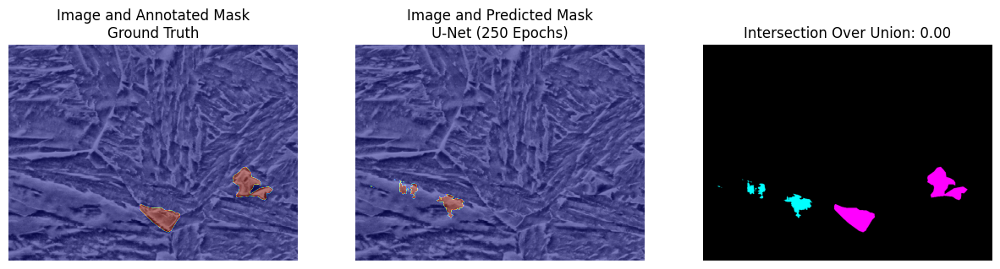

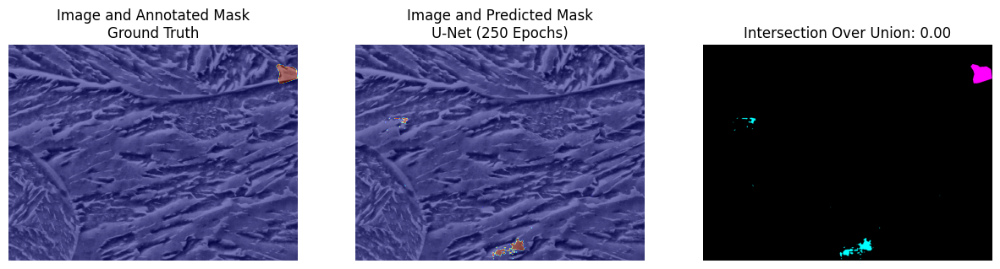

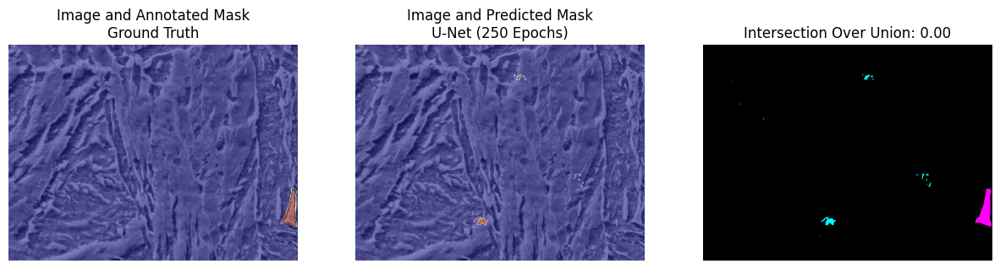

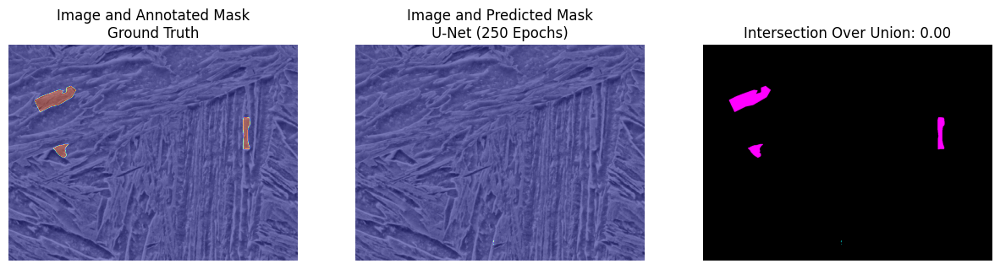

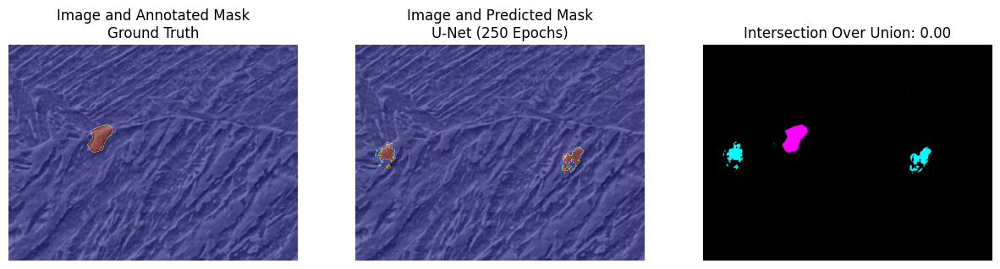

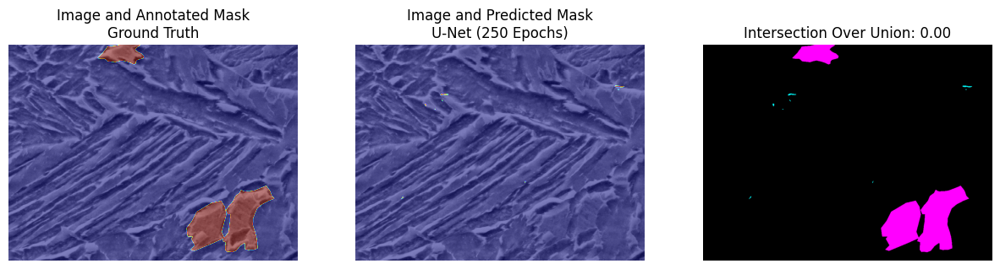

In [305]:
for item in rank_imgs_iou[:6]:
    
    # create figure 
    fig = plt.figure(figsize=(15, 10)) 

    # setting values to rows and column variables 
    rows = 1
    columns = 3

    fig.add_subplot(rows, columns, 1) 

    #plt.suptitle(image_sequence[item[0]])
    
    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(test_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Annotated Mask\nGround Truth')

    fig.add_subplot(rows, columns, 2) 

    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(pred_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Predicted Mask\nU-Net (250 Epochs)')

    fig.add_subplot(rows, columns, 3) 

    plt.imshow(iou_images[item[0]])
    plt.axis('off') 
    plt.title('Intersection Over Union: {0:.2f}'.format(item[2]*100))

    plt.show()

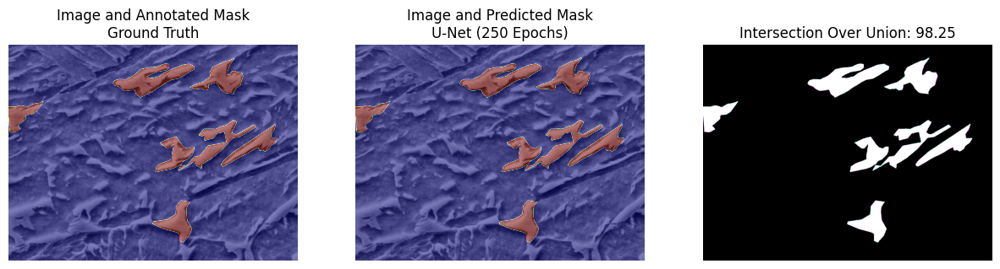

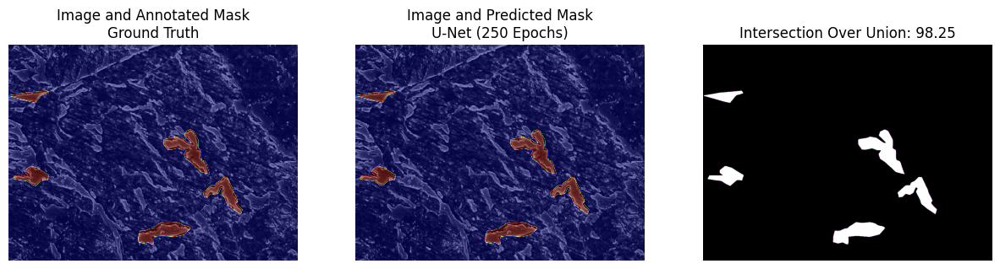

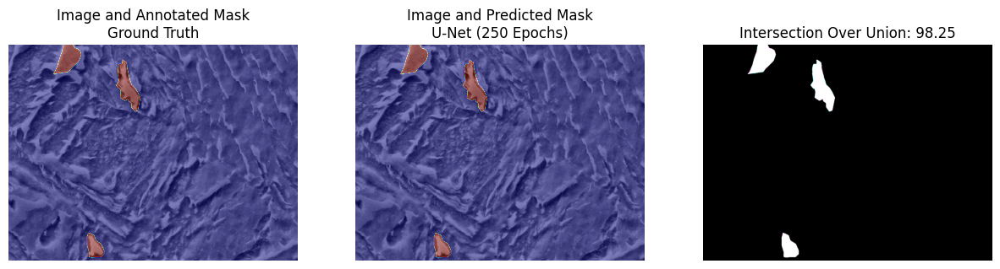

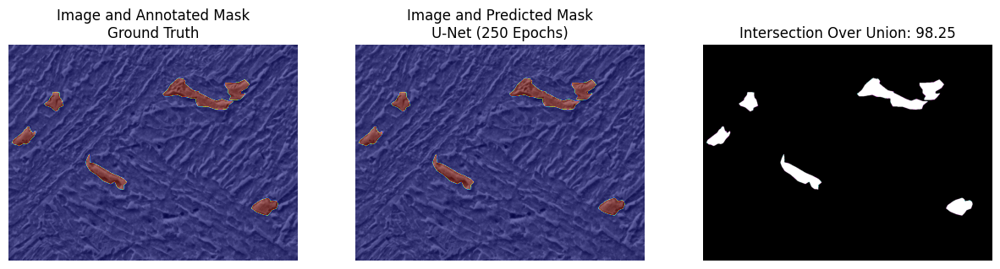

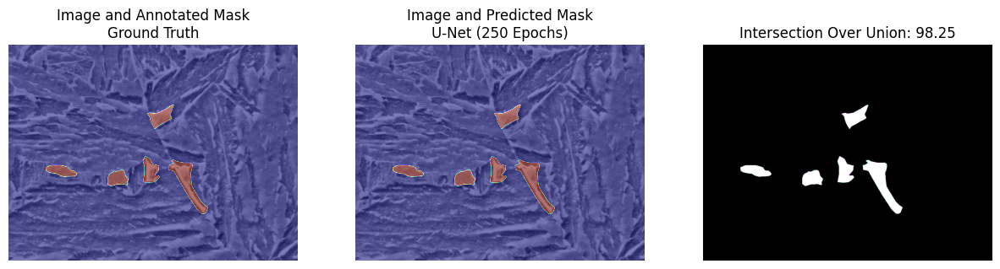

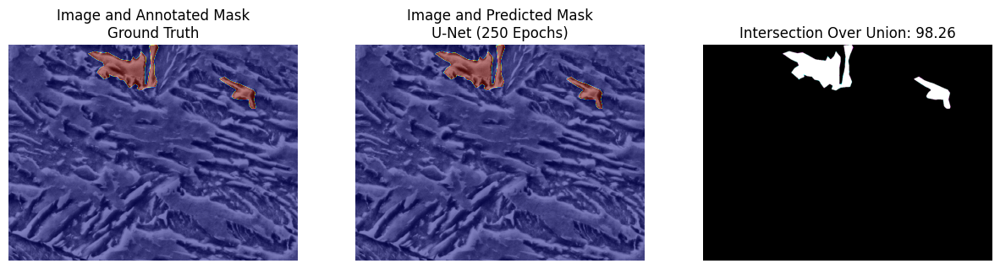

In [316]:
for item in rank_imgs_iou[440:446]:
    
    # create figure 
    fig = plt.figure(figsize=(15, 10)) 

    # setting values to rows and column variables 
    rows = 1
    columns = 3

    fig.add_subplot(rows, columns, 1) 

    #plt.suptitle(image_sequence[item[0]])
    
    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(test_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Annotated Mask\nGround Truth')

    fig.add_subplot(rows, columns, 2) 

    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(pred_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Predicted Mask\nU-Net (250 Epochs)')

    fig.add_subplot(rows, columns, 3) 

    plt.imshow(iou_images[item[0]])
    plt.axis('off') 
    plt.title('Intersection Over Union: {0:.2f}'.format(item[2]*100))

    plt.show()

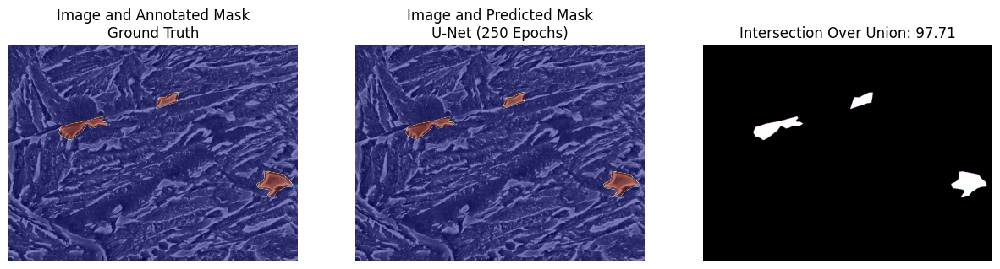

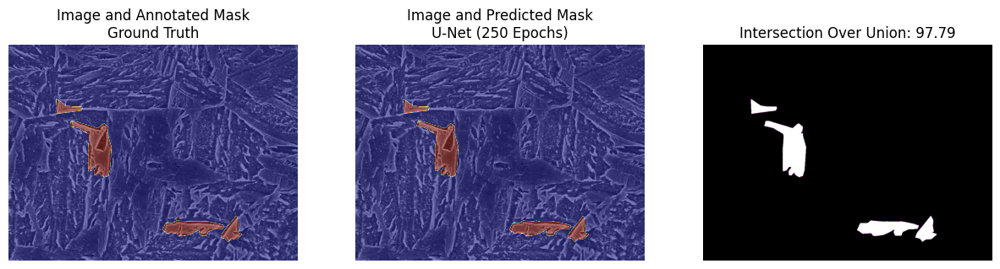

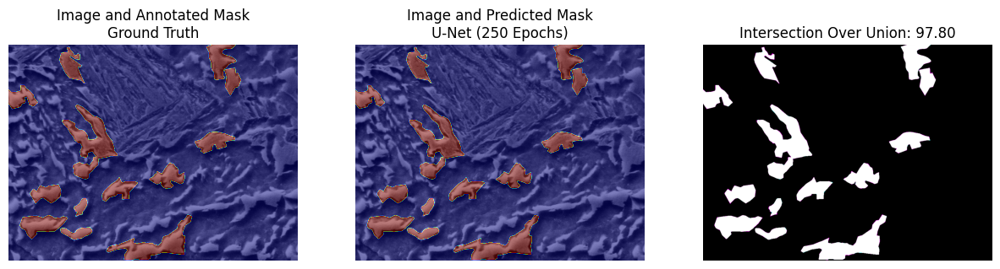

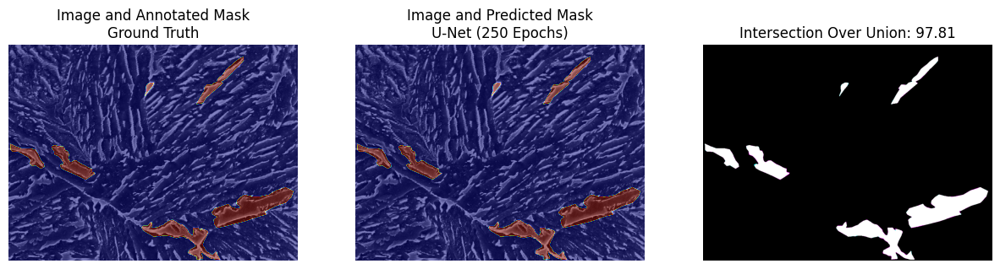

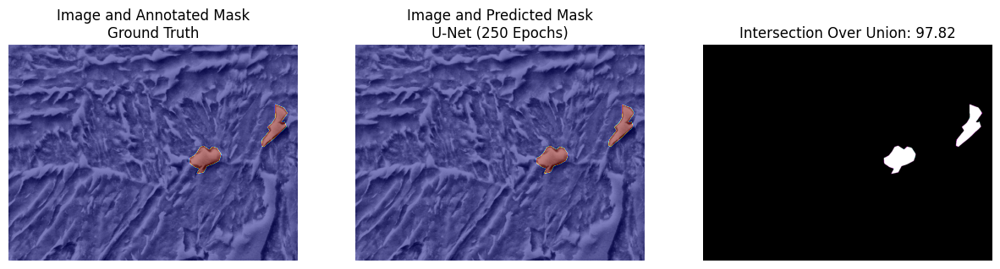

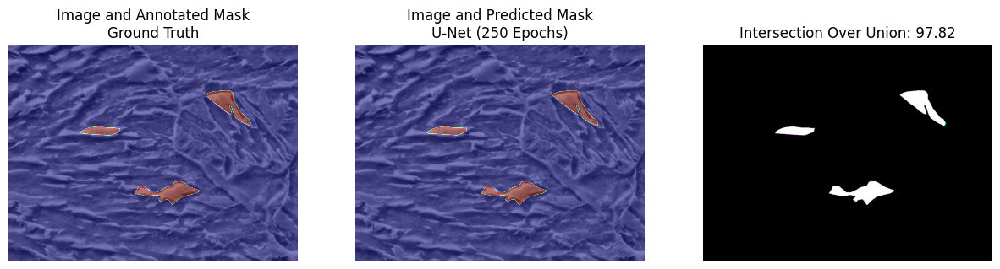

In [320]:
for item in rank_imgs_iou[340:346]:
    
    # create figure 
    fig = plt.figure(figsize=(15, 10)) 

    # setting values to rows and column variables 
    rows = 1
    columns = 3

    fig.add_subplot(rows, columns, 1) 

    #plt.suptitle(image_sequence[item[0]])
    
    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(test_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Annotated Mask\nGround Truth')

    fig.add_subplot(rows, columns, 2) 

    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(pred_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Predicted Mask\nU-Net (250 Epochs)')

    fig.add_subplot(rows, columns, 3) 

    plt.imshow(iou_images[item[0]])
    plt.axis('off') 
    plt.title('Intersection Over Union: {0:.2f}'.format(item[2]*100))

    plt.show()

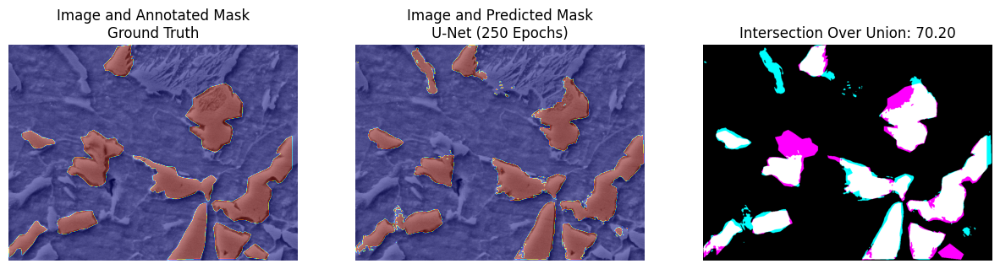

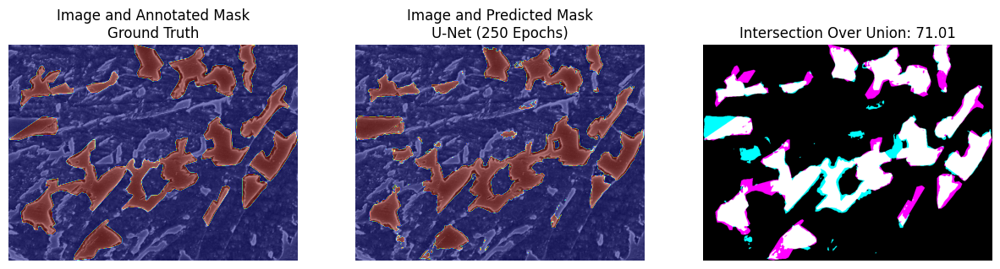

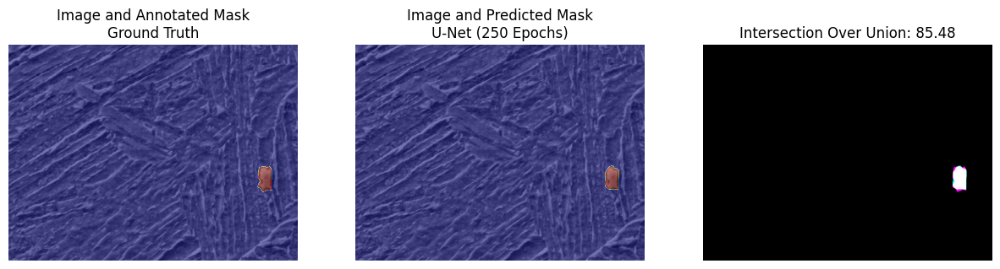

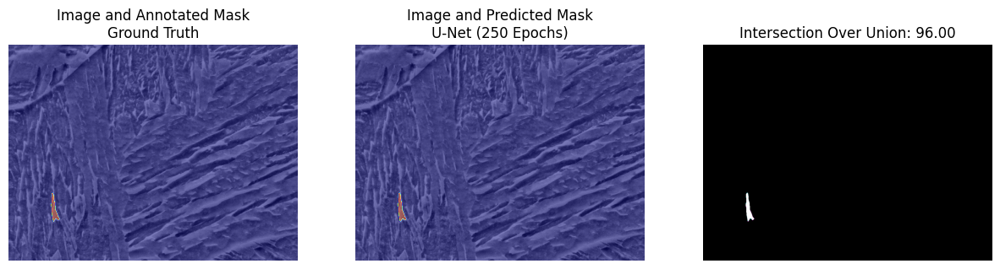

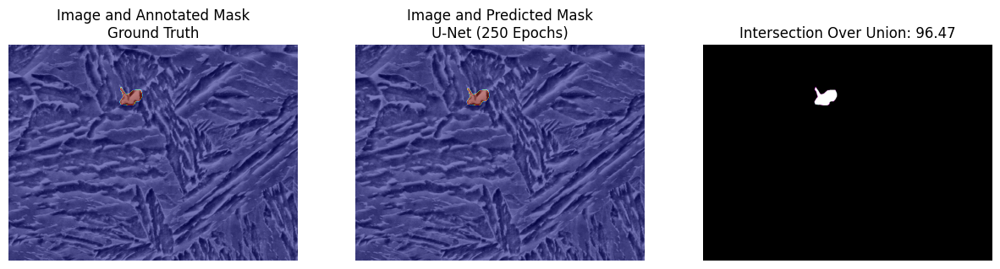

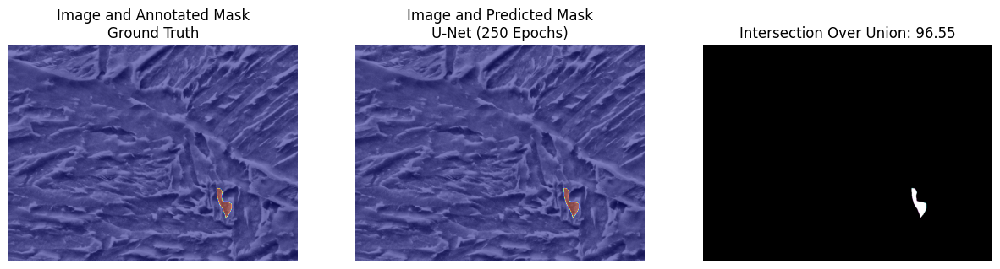

In [323]:
for item in rank_imgs_iou[300:306]:
    
    # create figure 
    fig = plt.figure(figsize=(15, 10)) 

    # setting values to rows and column variables 
    rows = 1
    columns = 3

    fig.add_subplot(rows, columns, 1) 

    #plt.suptitle(image_sequence[item[0]])
    
    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(test_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Annotated Mask\nGround Truth')

    fig.add_subplot(rows, columns, 2) 

    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(pred_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Predicted Mask\nU-Net (250 Epochs)')

    fig.add_subplot(rows, columns, 3) 

    plt.imshow(iou_images[item[0]])
    plt.axis('off') 
    plt.title('Intersection Over Union: {0:.2f}'.format(item[2]*100))

    plt.show()

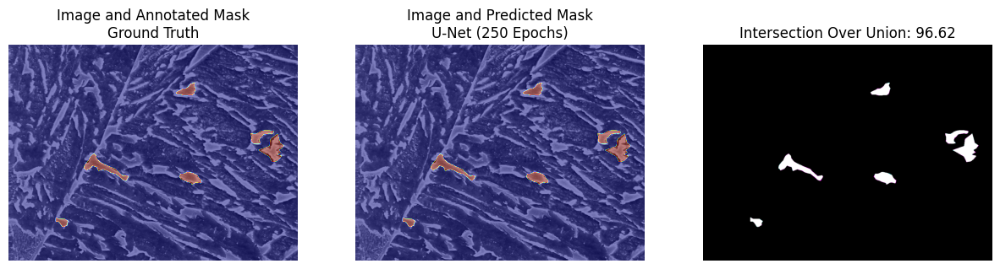

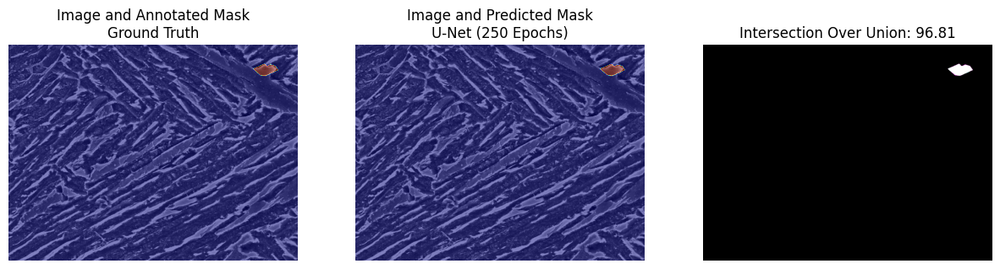

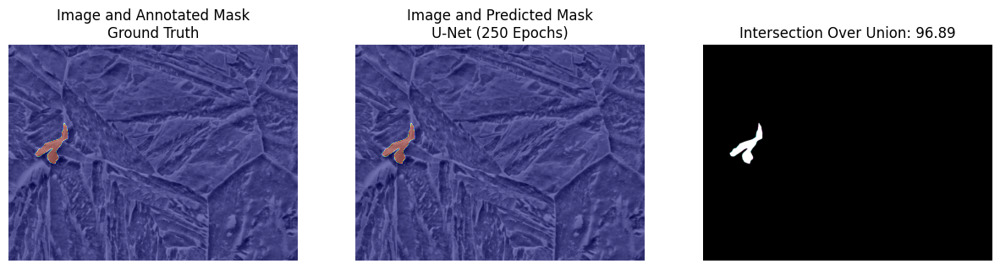

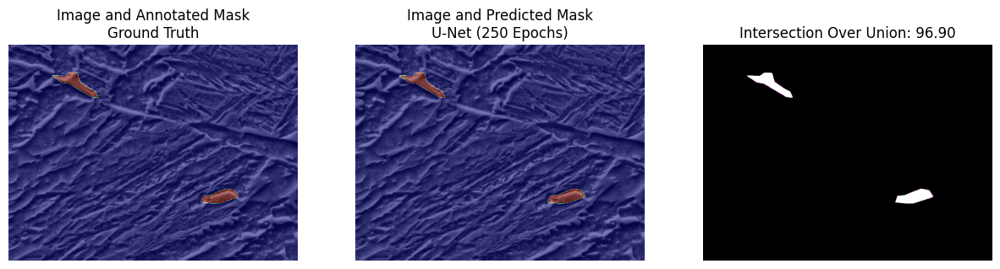

In [324]:
for item in rank_imgs_iou[307:311]:
    
    # create figure 
    fig = plt.figure(figsize=(15, 10)) 

    # setting values to rows and column variables 
    rows = 1
    columns = 3

    fig.add_subplot(rows, columns, 1) 

    #plt.suptitle(image_sequence[item[0]])
    
    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(test_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Annotated Mask\nGround Truth')

    fig.add_subplot(rows, columns, 2) 

    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(pred_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Predicted Mask\nU-Net (250 Epochs)')

    fig.add_subplot(rows, columns, 3) 

    plt.imshow(iou_images[item[0]])
    plt.axis('off') 
    plt.title('Intersection Over Union: {0:.2f}'.format(item[2]*100))

    plt.show()

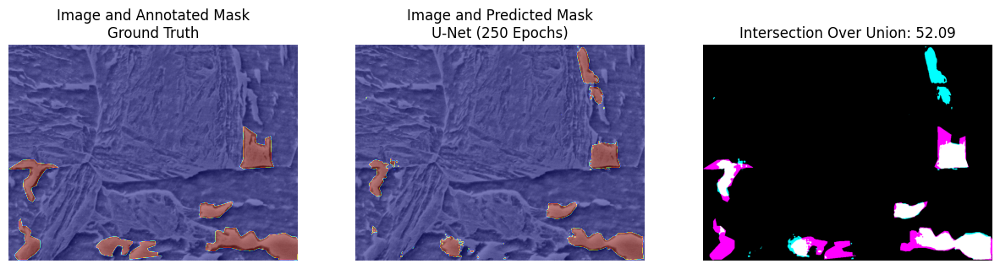

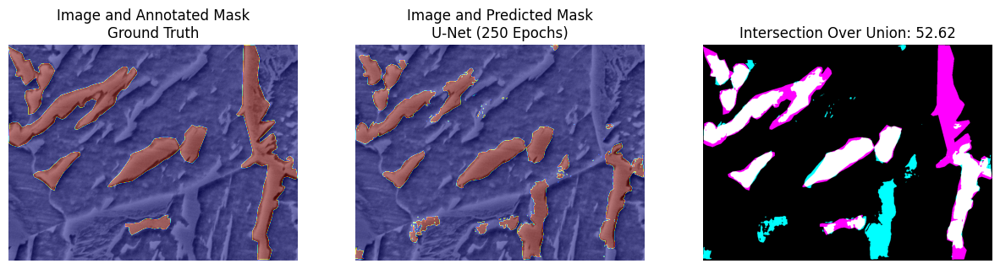

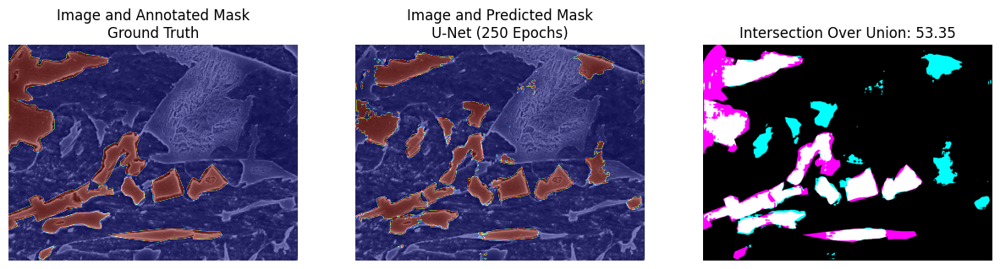

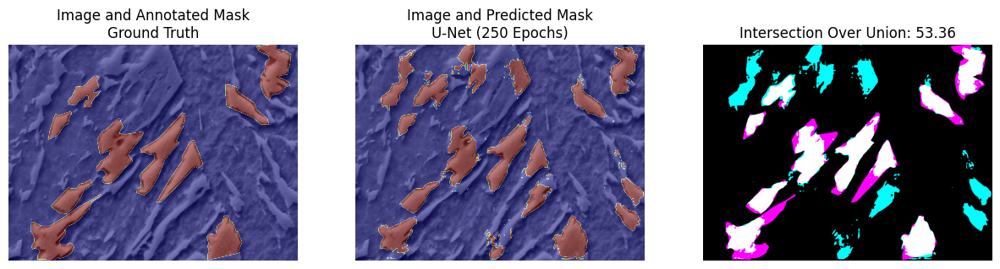

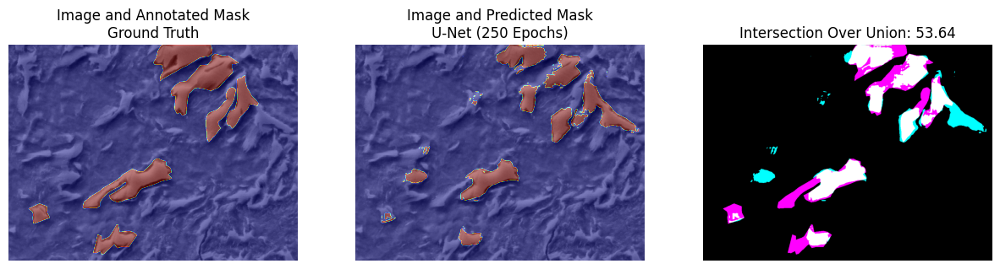

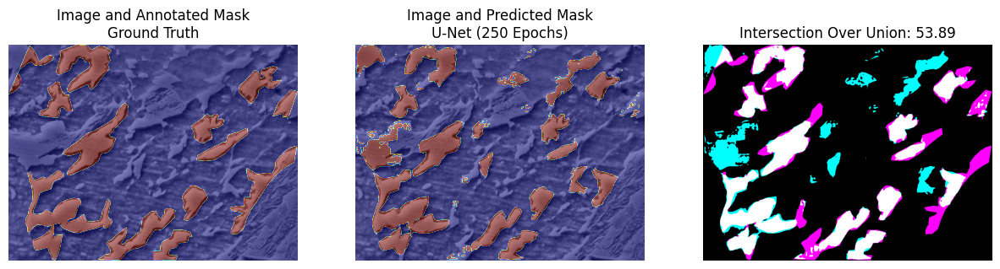

In [326]:
for item in rank_imgs_iou[270:276]:
    
    # create figure 
    fig = plt.figure(figsize=(15, 10)) 

    # setting values to rows and column variables 
    rows = 1
    columns = 3

    fig.add_subplot(rows, columns, 1) 

    #plt.suptitle(image_sequence[item[0]])
    
    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(test_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Annotated Mask\nGround Truth')

    fig.add_subplot(rows, columns, 2) 

    plt.imshow(test_images[item[0]], cmap=plt.cm.gray)
    plt.imshow(pred_masks[item[0]], cmap='jet', alpha=0.5)
    plt.axis('off') 
    plt.title('Image and Predicted Mask\nU-Net (250 Epochs)')

    fig.add_subplot(rows, columns, 3) 

    plt.imshow(iou_images[item[0]])
    plt.axis('off') 
    plt.title('Intersection Over Union: {0:.2f}'.format(item[2]*100))

    plt.show()

In [325]:
rank_imgs_iou[270:281]

[(501, 'IMG_00754', 0.5208991477472165),
 (74, 'IMG_00855', 0.5261715363084605),
 (563, 'IMG_00740', 0.5334816283251118),
 (240, 'IMG_01849', 0.5335972440468996),
 (45, 'IMG_00440', 0.5364288131291769),
 (623, 'IMG_00840', 0.5389357158076776),
 (743, 'IMG_01845', 0.5391344497965908),
 (301, 'IMG_00991', 0.543121387283237),
 (539, 'IMG_01617', 0.5443246795006221),
 (774, 'IMG_00800', 0.5508527519210346),
 (111, 'IMG_00531', 0.5512368358604662)]